In this notebook we transform the data into feature vectors. We want the feature vectors to capture information about the messages, which can be used to identify the catagory of message. 

We begin by loading in our training set. 

In [1]:
import numpy as np
import pandas as pd

In [18]:
df = pd.read_parquet("./data/training.parquet")
df.sample(10)

,Message,Catagory
17175,>\n>> Religion (especially Christianity) is no...,soc.religion.christian
465,In article <C5ut1s.3xA@bony1.bony.com> jake@bo...,talk.politics.mideast
7374,pat@rwing.UUCP (Pat Myrto) writes:\n\n\n>The p...,sci.crypt
1515,Archive-Name: rec-autos/part2\n\nAutomotive Ma...,rec.autos
13505,Lino Montuno (montuno@physics.su.OZ.AU) wrote:...,comp.sys.ibm.pc.hardware
15315,richardp@spock.dis.cccd.edu (Richard Patterson...,talk.politics.guns
11822,"In article <C5K6ny.AzJ@kirk.bu.oz.au>, bambi@k...",comp.windows.x
17965,\nI hate it when my posts do that... \n\n386dx...,misc.forsale
15275,\nJason Kratz writing:\n\n...\nJK>If they had ...,talk.politics.guns
5830,In article <C5JBKF.9B8@usenet.ucs.indiana.edu>...,comp.os.ms-windows.misc


We want to transform each of the messages into a numeric vector. One way to do this would be to allocate an extremely large vector, with one bit for every possible word. We could then set each bit to 'True' or '1' if the corresponding word appears in that message. In practice this is not practical because of the huge memory requirements. As such we use a 'Hashing vectoriser' which hashes the words to vectors of a fixed, finite size.

You can see that many of the messages contain non-standard words, such as email addresses. We don't want to use these in our feature engineering, so we set a 'token_pattern' parameter to ensure that only standard words are hashed. 

In [3]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', n_features=BUCKETS, alternate_sign = False)
hv

HashingVectorizer(alternate_sign=False, n_features=2048, norm=None,
                  token_pattern='(?u)\\b[A-Za-z]\\w+\\b')

In [4]:
hvcounts = hv.fit_transform(df["Message"])
hvcounts

Each of the 13,947 messages is now represented by one vector of length 'BUCKETS'. However, this is unlikely to expose structure in the data. 

In [ ]:
## Term Frequency - inverse document frequency (TF-idf)

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' or important within the document.

In [6]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)

In [7]:
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1739700 stored elements in Compressed Sparse Row format>

In [8]:
print(hvdf_tfidf)

  (0, 2014)	0.06765794101352499
  (0, 1997)	0.16535637050352664
  (0, 1989)	0.16072169699934202
  (0, 1979)	0.6218338235172829
  (0, 1977)	0.14203773783922014
  (0, 1699)	0.15117113075856428
  (0, 1554)	0.1258964917534874
  (0, 1441)	0.11981437544515144
  (0, 1438)	0.06691876867201565
  (0, 1366)	0.10224153022443293
  (0, 1297)	0.04769553917526332
  (0, 1227)	0.11092645901770962
  (0, 1145)	0.07690282102276018
  (0, 1088)	0.09257793224012664
  (0, 1054)	0.16846107110805053
  (0, 1051)	0.07359435702975588
  (0, 1045)	0.09584224080481393
  (0, 983)	0.08428072287354356
  (0, 924)	0.12583296150915282
  (0, 894)	0.1922478213661402
  (0, 839)	0.21367538228376587
  (0, 682)	0.0779112631698836
  (0, 637)	0.11409776909049334
  (0, 595)	0.16644735184748644
  (0, 534)	0.12914839641197493
  :	:
  (13946, 347)	0.15854004920490486
  (13946, 339)	0.03958741090759269
  (13946, 334)	0.10311031160070348
  (13946, 330)	0.22919747178893776
  (13946, 316)	0.040359217723971275
  (13946, 301)	0.0211187557003

In [9]:

import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)

pca_a = pca2.fit_transform(hvdf_tfidf)

In [10]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
7834,0.427588,0.020451
8183,0.637023,0.083162
2673,0.278240,-0.043450
5954,0.422564,-0.187945
7969,0.565267,0.205005
3002,0.508640,0.023651
3374,0.438417,-0.093661
3125,0.389577,-0.029706
6952,0.519723,-0.001448
3820,0.294697,0.063299


In [11]:
plot_data = pd.concat([df.reset_index(), pca_df], axis=1)


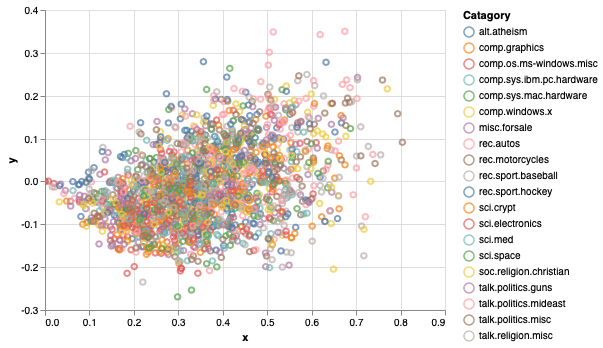

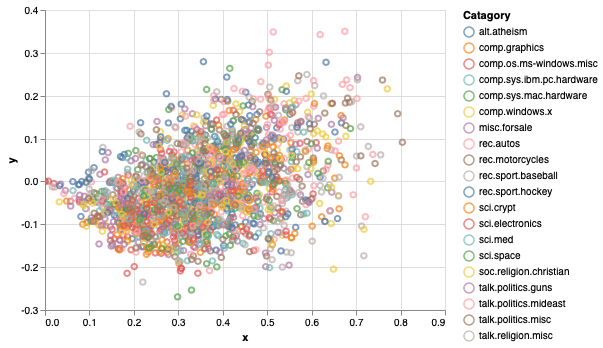

In [12]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Catagory").mark_point().interactive()

In [13]:
plot_data.Catagory.unique()

array(['misc.forsale', 'rec.sport.hockey', 'sci.space',
       'comp.sys.mac.hardware', 'talk.politics.guns',
       'comp.os.ms-windows.misc', 'sci.crypt', 'talk.religion.misc',
       'comp.sys.ibm.pc.hardware', 'talk.politics.mideast', 'alt.atheism',
       'rec.motorcycles', 'sci.med', 'comp.graphics', 'sci.electronics',
       'soc.religion.christian', 'rec.sport.baseball', 'comp.windows.x',
       'talk.politics.misc', 'rec.autos'], dtype=object)

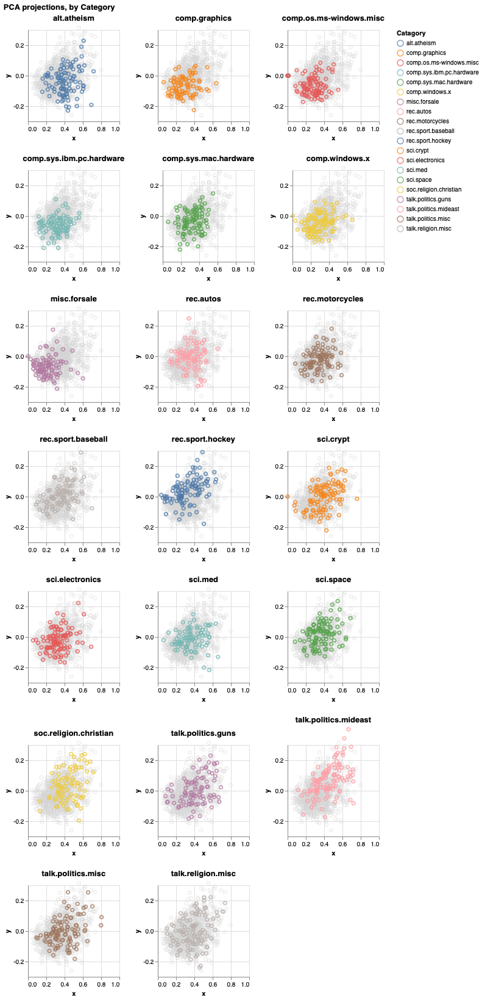

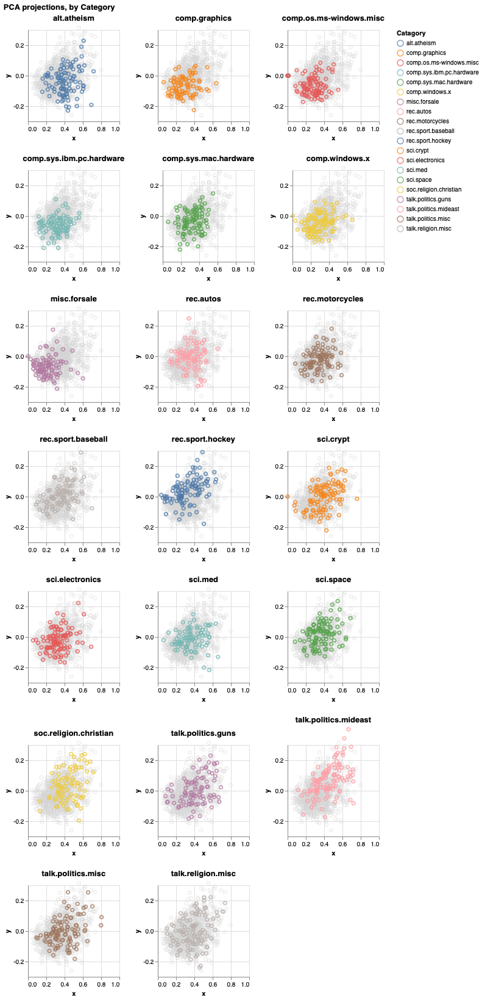

In [14]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 1))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Catagory:N'
)

# chart factory
def make_chart(base_chart, catagory, options):
    title = catagory
    chart = base_chart\
      .transform_filter(datum.Catagory == catagory)\
      .properties(width=options['width'], height=options['height'], title=title)
    return chart

#chart1 = alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="lightgray").mark_point() #.configure_mark(color='red', opacity=0.2)
chart1 = alt.Chart(plot_data.sample(1000)).encode(x="x", y="y").mark_point(opacity=0.3, color="lightgray")#.configure_mark(color='red', opacity=0.2)




def overlay_make_chart(base_chart, catagory, options, chart1):
    title = catagory
    #chart1 = base_chart\
     # .transform_filter(datum.Catagory == catagory)\
     # .properties(width=options['width'], height=options['height'], title=title)
    #chart1 = alt.Chart(plot_data.sample(1000)).encode(x="x", y="y").mark_point(opacity=0.3, color="gray")#.configure_mark(color='red', opacity=0.2)
    chart2 = base_chart\
      .transform_filter(datum.Catagory == catagory)\
      .properties(width=options['width'], height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


# create all charts
options = {'width': 150, 'height': 150}
#charts = [make_chart(base, catagory, options) for catagory in sorted(data.Catagory.unique())]

charts = [overlay_make_chart(base, catagory, options, chart1) for catagory in sorted(data.Catagory.unique())]

# make a single row
def make_hcc(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    hcc = alt.HConcatChart(hconcat=hconcat)
    return hcc

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_hcc(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

In [15]:
from sklearn.pipeline import Pipeline 
BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()

feat_pipeline = Pipeline([('vect',hv),('tfidf',tfidf)])

In [16]:
feat_pipeline.fit(df["Message"])

Pipeline(steps=[('vect',
                 HashingVectorizer(alternate_sign=False, n_features=2048,
                                   norm=None,
                                   token_pattern='(?u)\\b[A-Za-z]\\w+\\b')),
                ('tfidf', TfidfTransformer())])

In [17]:
from mlworkflows import util
util.serialize_to(feat_pipeline, "feature_pipeline.sav")